**Swin UNETR, FedProx, ISLES'24**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet, SwinUNETR
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.data import list_data_collate
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "E:/FYP/ISLES24 Split Preprocessed"
print(data_dir)

E:/FYP/ISLES24 Split Preprocessed


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "E:/FYP/Swin UNETR/Federated_Swin UNETR_checkpoints"
log_dir = "E:/FYP/Swin UNETR/Federated_Swin UNETR_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: E:/FYP/Swin UNETR/Federated_Swin UNETR_checkpoints
TensorBoard logs will be saved to: E:/FYP/Swin UNETR/Federated_Swin UNETR_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [7]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [8]:
target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [9]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [10]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


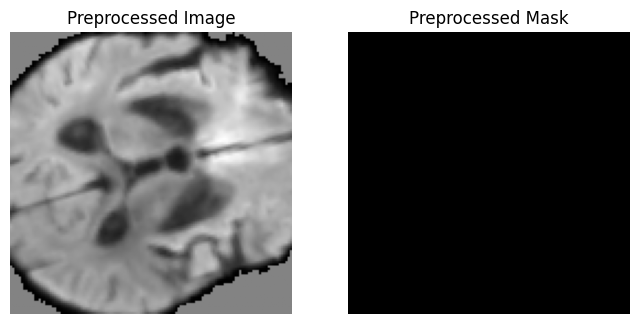

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


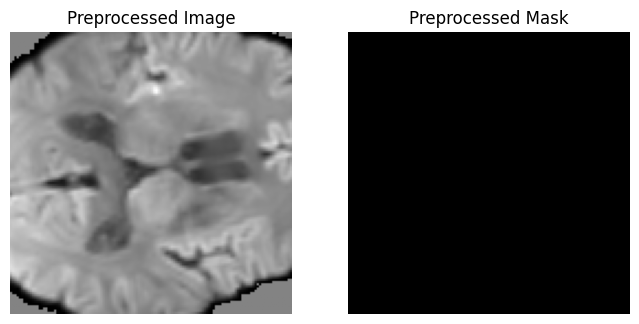


Client 0 dataset size: 50

Client 1
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


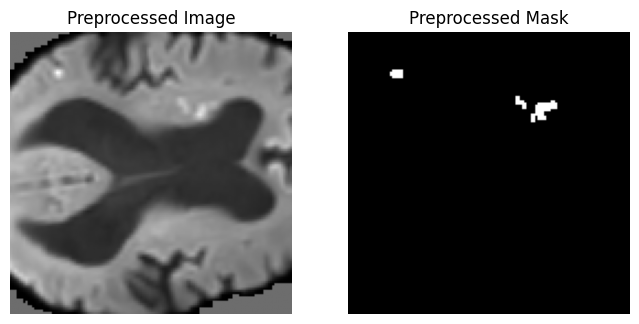

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


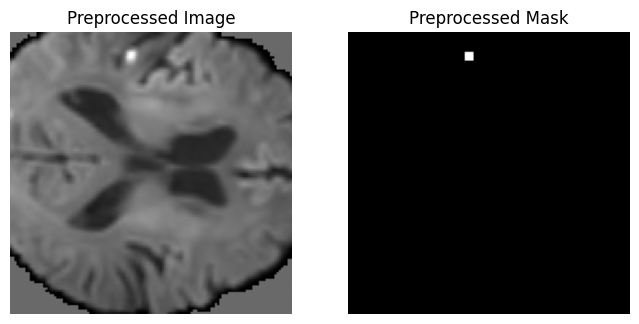


Client 1 dataset size: 50


In [11]:

original_root = "E:/FYP/ISLES24 Split"
processed_root = "E:/FYP/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    # orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    # orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    # dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    # mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(proc_dwi)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    # print("\n🔵 RAW SAMPLES")
    # for idx in sample_indices:

    #     img = nib.load(dwi_files[idx]).get_fdata()
    #     mask = nib.load(mask_files[idx]).get_fdata()

    #     print(
    #         f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
    #         f"Mask values: {torch.unique(torch.tensor(mask))}"
    #     )

    #     mid = img.shape[2] // 2

    #     plt.figure(figsize=(8,4))
    #     plt.subplot(1,2,1)
    #     plt.imshow(img[:,:,mid], cmap="gray")
    #     plt.title("Raw Image")
    #     plt.axis("off")

    #     plt.subplot(1,2,2)
    #     plt.imshow(mask[:,:,mid], cmap="gray")
    #     plt.title("Raw Mask")
    #     plt.axis("off")
    #     plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [12]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [13]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## Swin UNETR

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = SwinUNETR(
        in_channels=1,
        out_channels=1,
        feature_size=24,
        use_checkpoint=True
    ).to(device)

    print(model)
    return model

Using device: cuda


**Client Class**

In [16]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=list_data_collate)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu   # FedProx coefficient
    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx proximal term 
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [17]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    # prevent device inconsistency- if client tensors are on different devices (CPU vs GPU), this can crash:
                    new_params[key] += client_params_list[i][key].to(param.device)

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)
    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [18]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Linear(in_features=

**Federated Training loop**

In [19]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8258 | Dice: 0.1498 | IoU: 0.0810 | HD95: 80.9489


Client 0 | Epoch 2/20 | Loss: 0.7883 | Dice: 0.2349 | IoU: 0.1331 | HD95: 79.8421


Client 0 | Epoch 3/20 | Loss: 0.7773 | Dice: 0.2486 | IoU: 0.1419 | HD95: 80.0563


Client 0 | Epoch 4/20 | Loss: 0.7688 | Dice: 0.2635 | IoU: 0.1517 | HD95: 80.0871


Client 0 | Epoch 5/20 | Loss: 0.7614 | Dice: 0.2828 | IoU: 0.1647 | HD95: 78.8771


Client 0 | Epoch 6/20 | Loss: 0.7546 | Dice: 0.2955 | IoU: 0.1733 | HD95: 77.9372


Client 0 | Epoch 7/20 | Loss: 0.7496 | Dice: 0.3109 | IoU: 0.1841 | HD95: 74.9954


Client 0 | Epoch 8/20 | Loss: 0.7420 | Dice: 0.3110 | IoU: 0.1841 | HD95: 75.8884


Client 0 | Epoch 9/20 | Loss: 0.7338 | Dice: 0.3583 | IoU: 0.2182 | HD95: 71.0912


Client 0 | Epoch 10/20 | Loss: 0.7276 | Dice: 0.3776 | IoU: 0.2327 | HD95: 72.7617


Client 0 | Epoch 11/20 | Loss: 0.7215 | Dice: 0.3922 | IoU: 0.2439 | HD95: 72.1411


Client 0 | Epoch 12/20 | Loss: 0.7119 | Dice: 0.4047 | IoU: 0.2537 | HD95: 68.4356


Client 0 | Epoch 13/20 | Loss: 0.7084 | Dice: 0.4031 | IoU: 0.2524 | HD95: 69.7899


Client 0 | Epoch 14/20 | Loss: 0.6985 | Dice: 0.4321 | IoU: 0.2756 | HD95: 67.5545


Client 0 | Epoch 15/20 | Loss: 0.6911 | Dice: 0.4597 | IoU: 0.2984 | HD95: 59.0292


Client 0 | Epoch 16/20 | Loss: 0.6866 | Dice: 0.4774 | IoU: 0.3135 | HD95: 62.1077


Client 0 | Epoch 17/20 | Loss: 0.6799 | Dice: 0.4731 | IoU: 0.3099 | HD95: 58.6574


Client 0 | Epoch 18/20 | Loss: 0.6740 | Dice: 0.4789 | IoU: 0.3148 | HD95: 60.4823


Client 0 | Epoch 19/20 | Loss: 0.6679 | Dice: 0.4737 | IoU: 0.3104 | HD95: 61.5409


Clients Training:  50%|█████     | 1/2 [19:12<19:12, 1152.28s/it]

Client 0 | Epoch 20/20 | Loss: 0.6644 | Dice: 0.5035 | IoU: 0.3365 | HD95: 59.2744
Client 0 | Loss=0.7267 | Dice=0.5035 | IoU=0.3365 | HD95=59.2744


Client 1 | Epoch 1/20 | Loss: 0.8301 | Dice: 0.1204 | IoU: 0.0640 | HD95: 75.6103


Client 1 | Epoch 2/20 | Loss: 0.7976 | Dice: 0.1877 | IoU: 0.1035 | HD95: 76.5756


Client 1 | Epoch 3/20 | Loss: 0.7863 | Dice: 0.2158 | IoU: 0.1209 | HD95: 76.8609


Client 1 | Epoch 4/20 | Loss: 0.7782 | Dice: 0.2309 | IoU: 0.1305 | HD95: 76.2906


Client 1 | Epoch 5/20 | Loss: 0.7711 | Dice: 0.2397 | IoU: 0.1362 | HD95: 77.0754


Client 1 | Epoch 6/20 | Loss: 0.7650 | Dice: 0.2482 | IoU: 0.1417 | HD95: 76.4407


Client 1 | Epoch 7/20 | Loss: 0.7588 | Dice: 0.2663 | IoU: 0.1536 | HD95: 75.3756


Client 1 | Epoch 8/20 | Loss: 0.7534 | Dice: 0.2916 | IoU: 0.1707 | HD95: 74.8345


Client 1 | Epoch 9/20 | Loss: 0.7477 | Dice: 0.3645 | IoU: 0.2229 | HD95: 69.8424


Client 1 | Epoch 10/20 | Loss: 0.7414 | Dice: 0.3232 | IoU: 0.1927 | HD95: 71.9037


Client 1 | Epoch 11/20 | Loss: 0.7335 | Dice: 0.3832 | IoU: 0.2370 | HD95: 68.8757


Client 1 | Epoch 12/20 | Loss: 0.7304 | Dice: 0.3652 | IoU: 0.2234 | HD95: 69.5840


Client 1 | Epoch 13/20 | Loss: 0.7243 | Dice: 0.3750 | IoU: 0.2308 | HD95: 69.3549


Client 1 | Epoch 14/20 | Loss: 0.7171 | Dice: 0.4010 | IoU: 0.2508 | HD95: 66.1895


Client 1 | Epoch 15/20 | Loss: 0.7082 | Dice: 0.4135 | IoU: 0.2606 | HD95: 64.0381


Client 1 | Epoch 16/20 | Loss: 0.7031 | Dice: 0.4339 | IoU: 0.2770 | HD95: 62.5798


Client 1 | Epoch 17/20 | Loss: 0.6920 | Dice: 0.5082 | IoU: 0.3406 | HD95: 57.5685


Client 1 | Epoch 18/20 | Loss: 0.6863 | Dice: 0.4962 | IoU: 0.3299 | HD95: 56.2271


Client 1 | Epoch 19/20 | Loss: 0.6836 | Dice: 0.4630 | IoU: 0.3013 | HD95: 62.1297


Client 1 Epochs: 100%|██████████| 20/20 [19:00<00:00, 57.05s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.6871 | Dice: 0.4302 | IoU: 0.2741 | HD95: 61.3514
Client 1 | Loss=0.7398 | Dice=0.4302 | IoU=0.2741 | HD95=61.3514


Best global model updated with Dice=0.4189
Global | Val Loss=0.6402 | Dice=0.4189 | IoU=0.2649 | HD95=45.8632
Checkpoint saved for round 1 at E:/FYP/Swin UNETR/Federated_Swin UNETR_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6551 | Dice: 0.4227 | IoU: 0.2680 | HD95: 63.2871


Client 0 | Epoch 2/20 | Loss: 0.6427 | Dice: 0.4729 | IoU: 0.3096 | HD95: 55.2834


Client 0 | Epoch 3/20 | Loss: 0.6282 | Dice: 0.5033 | IoU: 0.3363 | HD95: 52.8052


Client 0 | Epoch 4/20 | Loss: 0.6198 | Dice: 0.5196 | IoU: 0.3510 | HD95: 51.9986


Client 0 | Epoch 5/20 | Loss: 0.6122 | Dice: 0.5378 | IoU: 0.3678 | HD95: 48.4265


Client 0 | Epoch 6/20 | Loss: 0.6077 | Dice: 0.5301 | IoU: 0.3607 | HD95: 50.3294


Client 0 | Epoch 7/20 | Loss: 0.6012 | Dice: 0.5350 | IoU: 0.3652 | HD95: 48.3676


Client 0 | Epoch 8/20 | Loss: 0.5955 | Dice: 0.5315 | IoU: 0.3620 | HD95: 46.8061


Client 0 | Epoch 9/20 | Loss: 0.5976 | Dice: 0.5189 | IoU: 0.3503 | HD95: 47.0670


Client 0 | Epoch 10/20 | Loss: 0.5952 | Dice: 0.5023 | IoU: 0.3354 | HD95: 51.6060


Client 0 | Epoch 11/20 | Loss: 0.5794 | Dice: 0.5746 | IoU: 0.4032 | HD95: 45.4717


Client 0 | Epoch 12/20 | Loss: 0.5757 | Dice: 0.5796 | IoU: 0.4081 | HD95: 45.5950


Client 0 | Epoch 13/20 | Loss: 0.5686 | Dice: 0.5650 | IoU: 0.3937 | HD95: 44.5447


Client 0 | Epoch 14/20 | Loss: 0.5619 | Dice: 0.5934 | IoU: 0.4218 | HD95: 42.1247


Client 0 | Epoch 15/20 | Loss: 0.5552 | Dice: 0.5901 | IoU: 0.4185 | HD95: 40.3997


Client 0 | Epoch 16/20 | Loss: 0.5550 | Dice: 0.5660 | IoU: 0.3947 | HD95: 44.5707


Client 0 | Epoch 17/20 | Loss: 0.5594 | Dice: 0.5411 | IoU: 0.3709 | HD95: 47.6125


Client 0 | Epoch 18/20 | Loss: 0.5451 | Dice: 0.5840 | IoU: 0.4125 | HD95: 39.9897


Client 0 | Epoch 19/20 | Loss: 0.5349 | Dice: 0.6223 | IoU: 0.4517 | HD95: 38.2071


Clients Training:  50%|█████     | 1/2 [18:05<18:05, 1085.13s/it]

Client 0 | Epoch 20/20 | Loss: 0.5323 | Dice: 0.5981 | IoU: 0.4266 | HD95: 36.3870
Client 0 | Loss=0.5861 | Dice=0.5981 | IoU=0.4266 | HD95=36.3870


Client 1 | Epoch 1/20 | Loss: 0.6678 | Dice: 0.4909 | IoU: 0.3253 | HD95: 54.6552


Client 1 | Epoch 2/20 | Loss: 0.6569 | Dice: 0.4830 | IoU: 0.3184 | HD95: 50.6927


Client 1 | Epoch 3/20 | Loss: 0.6521 | Dice: 0.5061 | IoU: 0.3388 | HD95: 52.8524


Client 1 | Epoch 4/20 | Loss: 0.6435 | Dice: 0.5193 | IoU: 0.3507 | HD95: 46.9194


Client 1 | Epoch 5/20 | Loss: 0.6401 | Dice: 0.5248 | IoU: 0.3557 | HD95: 47.8730


Client 1 | Epoch 6/20 | Loss: 0.6295 | Dice: 0.5590 | IoU: 0.3879 | HD95: 38.8685


Client 1 | Epoch 7/20 | Loss: 0.6233 | Dice: 0.5460 | IoU: 0.3755 | HD95: 48.5805


Client 1 | Epoch 8/20 | Loss: 0.6158 | Dice: 0.5691 | IoU: 0.3977 | HD95: 41.2775


Client 1 | Epoch 9/20 | Loss: 0.6199 | Dice: 0.5371 | IoU: 0.3672 | HD95: 44.7539


Client 1 | Epoch 10/20 | Loss: 0.6105 | Dice: 0.5386 | IoU: 0.3685 | HD95: 45.0283


Client 1 | Epoch 11/20 | Loss: 0.6048 | Dice: 0.5575 | IoU: 0.3865 | HD95: 43.0174


Client 1 | Epoch 12/20 | Loss: 0.5952 | Dice: 0.5850 | IoU: 0.4134 | HD95: 36.4783


Client 1 | Epoch 13/20 | Loss: 0.5937 | Dice: 0.5607 | IoU: 0.3896 | HD95: 39.4401


Client 1 | Epoch 14/20 | Loss: 0.5838 | Dice: 0.6038 | IoU: 0.4324 | HD95: 34.2630


Client 1 | Epoch 15/20 | Loss: 0.5768 | Dice: 0.6127 | IoU: 0.4417 | HD95: 31.1682


Client 1 | Epoch 16/20 | Loss: 0.5723 | Dice: 0.6183 | IoU: 0.4475 | HD95: 32.2325


Client 1 | Epoch 17/20 | Loss: 0.5685 | Dice: 0.6106 | IoU: 0.4395 | HD95: 36.8082


Client 1 | Epoch 18/20 | Loss: 0.5792 | Dice: 0.5675 | IoU: 0.3962 | HD95: 37.7562


Client 1 | Epoch 19/20 | Loss: 0.5637 | Dice: 0.5905 | IoU: 0.4189 | HD95: 36.0671


Client 1 Epochs: 100%|██████████| 20/20 [17:59<00:00, 54.00s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.5516 | Dice: 0.6335 | IoU: 0.4636 | HD95: 33.3781
Client 1 | Loss=0.6075 | Dice=0.6335 | IoU=0.4636 | HD95=33.3781


Best global model updated with Dice=0.6146
Global | Val Loss=0.5028 | Dice=0.6146 | IoU=0.4436 | HD95=34.3113
Checkpoint saved for round 2 at E:/FYP/Swin UNETR/Federated_Swin UNETR_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5165 | Dice: 0.6100 | IoU: 0.4388 | HD95: 37.7356


Client 0 | Epoch 2/20 | Loss: 0.5106 | Dice: 0.6005 | IoU: 0.4291 | HD95: 35.9451


Client 0 | Epoch 3/20 | Loss: 0.5018 | Dice: 0.6180 | IoU: 0.4471 | HD95: 36.0511


Client 0 | Epoch 4/20 | Loss: 0.4966 | Dice: 0.6181 | IoU: 0.4473 | HD95: 37.0562


Client 0 | Epoch 5/20 | Loss: 0.4866 | Dice: 0.6483 | IoU: 0.4797 | HD95: 32.6215


Client 0 | Epoch 6/20 | Loss: 0.4877 | Dice: 0.6398 | IoU: 0.4704 | HD95: 32.4885


Client 0 | Epoch 7/20 | Loss: 0.4831 | Dice: 0.6424 | IoU: 0.4731 | HD95: 36.5893


Client 0 | Epoch 8/20 | Loss: 0.4837 | Dice: 0.6060 | IoU: 0.4348 | HD95: 35.3885


Client 0 | Epoch 9/20 | Loss: 0.4677 | Dice: 0.6620 | IoU: 0.4948 | HD95: 32.7891


Client 0 | Epoch 10/20 | Loss: 0.4618 | Dice: 0.6698 | IoU: 0.5035 | HD95: 24.6216


Client 0 | Epoch 11/20 | Loss: 0.4562 | Dice: 0.6730 | IoU: 0.5071 | HD95: 28.4270


Client 0 | Epoch 12/20 | Loss: 0.4496 | Dice: 0.6849 | IoU: 0.5208 | HD95: 22.4148


Client 0 | Epoch 13/20 | Loss: 0.4439 | Dice: 0.6957 | IoU: 0.5334 | HD95: 20.7284


Client 0 | Epoch 14/20 | Loss: 0.4404 | Dice: 0.6898 | IoU: 0.5265 | HD95: 24.9703


Client 0 | Epoch 15/20 | Loss: 0.4418 | Dice: 0.6500 | IoU: 0.4815 | HD95: 31.3535


Client 0 | Epoch 16/20 | Loss: 0.4320 | Dice: 0.6740 | IoU: 0.5083 | HD95: 27.3792


Client 0 | Epoch 17/20 | Loss: 0.4206 | Dice: 0.7080 | IoU: 0.5480 | HD95: 27.4494


Client 0 | Epoch 18/20 | Loss: 0.4157 | Dice: 0.7076 | IoU: 0.5475 | HD95: 21.8383


Client 0 | Epoch 19/20 | Loss: 0.4198 | Dice: 0.6494 | IoU: 0.4809 | HD95: 27.2541


Clients Training:  50%|█████     | 1/2 [17:18<17:18, 1038.47s/it]

Client 0 | Epoch 20/20 | Loss: 0.4153 | Dice: 0.6787 | IoU: 0.5136 | HD95: 27.5637
Client 0 | Loss=0.4616 | Dice=0.6787 | IoU=0.5136 | HD95=27.5637


Client 1 | Epoch 1/20 | Loss: 0.5400 | Dice: 0.6116 | IoU: 0.4405 | HD95: 32.9201


Client 1 | Epoch 2/20 | Loss: 0.5401 | Dice: 0.5808 | IoU: 0.4092 | HD95: 35.9413


Client 1 | Epoch 3/20 | Loss: 0.5354 | Dice: 0.5860 | IoU: 0.4145 | HD95: 35.8798


Client 1 | Epoch 4/20 | Loss: 0.5285 | Dice: 0.6352 | IoU: 0.4654 | HD95: 35.1035


Client 1 | Epoch 5/20 | Loss: 0.5153 | Dice: 0.6376 | IoU: 0.4680 | HD95: 27.9569


Client 1 | Epoch 6/20 | Loss: 0.5046 | Dice: 0.6690 | IoU: 0.5026 | HD95: 26.4127


Client 1 | Epoch 7/20 | Loss: 0.5023 | Dice: 0.6635 | IoU: 0.4965 | HD95: 24.1918


Client 1 | Epoch 8/20 | Loss: 0.5031 | Dice: 0.6393 | IoU: 0.4698 | HD95: 31.8281


Client 1 | Epoch 9/20 | Loss: 0.4922 | Dice: 0.6576 | IoU: 0.4899 | HD95: 26.8602


Client 1 | Epoch 10/20 | Loss: 0.4876 | Dice: 0.6612 | IoU: 0.4938 | HD95: 30.0869


Client 1 | Epoch 11/20 | Loss: 0.4739 | Dice: 0.6935 | IoU: 0.5308 | HD95: 22.7732


Client 1 | Epoch 12/20 | Loss: 0.4700 | Dice: 0.6923 | IoU: 0.5294 | HD95: 22.1147


Client 1 | Epoch 13/20 | Loss: 0.4635 | Dice: 0.6923 | IoU: 0.5294 | HD95: 20.5393


Client 1 | Epoch 14/20 | Loss: 0.4563 | Dice: 0.7033 | IoU: 0.5424 | HD95: 21.2481


Client 1 | Epoch 15/20 | Loss: 0.4495 | Dice: 0.7018 | IoU: 0.5406 | HD95: 18.5617


Client 1 | Epoch 16/20 | Loss: 0.4530 | Dice: 0.6732 | IoU: 0.5074 | HD95: 29.6024


Client 1 | Epoch 17/20 | Loss: 0.4437 | Dice: 0.6893 | IoU: 0.5259 | HD95: 26.5550


Client 1 | Epoch 18/20 | Loss: 0.4335 | Dice: 0.7099 | IoU: 0.5503 | HD95: 19.1212


Client 1 | Epoch 19/20 | Loss: 0.4203 | Dice: 0.7218 | IoU: 0.5647 | HD95: 15.8283


Client 1 Epochs: 100%|██████████| 20/20 [17:26<00:00, 52.32s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.4178 | Dice: 0.7155 | IoU: 0.5570 | HD95: 17.6721
Client 1 | Loss=0.4815 | Dice=0.7155 | IoU=0.5570 | HD95=17.6721


Best global model updated with Dice=0.6795
Global | Val Loss=0.4058 | Dice=0.6795 | IoU=0.5146 | HD95=20.1723
Checkpoint saved for round 3 at E:/FYP/Swin UNETR/Federated_Swin UNETR_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4047 | Dice: 0.6540 | IoU: 0.4858 | HD95: 23.5695


Client 0 | Epoch 2/20 | Loss: 0.3961 | Dice: 0.6715 | IoU: 0.5054 | HD95: 28.0546


Client 0 | Epoch 3/20 | Loss: 0.3811 | Dice: 0.7087 | IoU: 0.5488 | HD95: 24.7564


Client 0 | Epoch 4/20 | Loss: 0.3830 | Dice: 0.6889 | IoU: 0.5255 | HD95: 22.4387


Client 0 | Epoch 5/20 | Loss: 0.3838 | Dice: 0.6851 | IoU: 0.5210 | HD95: 29.1207


Client 0 | Epoch 6/20 | Loss: 0.3695 | Dice: 0.7129 | IoU: 0.5539 | HD95: 20.1003


Client 0 | Epoch 7/20 | Loss: 0.3685 | Dice: 0.7125 | IoU: 0.5533 | HD95: 19.3856


Client 0 | Epoch 8/20 | Loss: 0.3615 | Dice: 0.7190 | IoU: 0.5612 | HD95: 17.3081


Client 0 | Epoch 9/20 | Loss: 0.3485 | Dice: 0.7370 | IoU: 0.5835 | HD95: 14.5545


Client 0 | Epoch 10/20 | Loss: 0.3506 | Dice: 0.7367 | IoU: 0.5832 | HD95: 19.2927


Client 0 | Epoch 11/20 | Loss: 0.3404 | Dice: 0.7383 | IoU: 0.5852 | HD95: 15.0683


Client 0 | Epoch 12/20 | Loss: 0.3744 | Dice: 0.6723 | IoU: 0.5063 | HD95: 30.5329


Client 0 | Epoch 13/20 | Loss: 0.3815 | Dice: 0.6510 | IoU: 0.4825 | HD95: 30.4190


Client 0 | Epoch 14/20 | Loss: 0.3512 | Dice: 0.7111 | IoU: 0.5517 | HD95: 18.8846


Client 0 | Epoch 15/20 | Loss: 0.3404 | Dice: 0.7116 | IoU: 0.5523 | HD95: 16.2470


Client 0 | Epoch 16/20 | Loss: 0.3301 | Dice: 0.7439 | IoU: 0.5923 | HD95: 17.3573


Client 0 | Epoch 17/20 | Loss: 0.3210 | Dice: 0.7465 | IoU: 0.5956 | HD95: 15.6112


Client 0 | Epoch 18/20 | Loss: 0.3188 | Dice: 0.7492 | IoU: 0.5990 | HD95: 15.5990


Client 0 | Epoch 19/20 | Loss: 0.3128 | Dice: 0.7577 | IoU: 0.6099 | HD95: 16.3070


Clients Training:  50%|█████     | 1/2 [17:00<17:00, 1020.13s/it]

Client 0 | Epoch 20/20 | Loss: 0.3058 | Dice: 0.7689 | IoU: 0.6246 | HD95: 10.7499
Client 0 | Loss=0.3562 | Dice=0.7689 | IoU=0.6246 | HD95=10.7499


Client 1 | Epoch 1/20 | Loss: 0.4145 | Dice: 0.6829 | IoU: 0.5185 | HD95: 22.2575


Client 1 | Epoch 2/20 | Loss: 0.4054 | Dice: 0.7166 | IoU: 0.5584 | HD95: 18.0624


Client 1 | Epoch 3/20 | Loss: 0.4116 | Dice: 0.6964 | IoU: 0.5342 | HD95: 22.3529


Client 1 | Epoch 4/20 | Loss: 0.3973 | Dice: 0.7181 | IoU: 0.5602 | HD95: 22.8372


Client 1 | Epoch 5/20 | Loss: 0.3916 | Dice: 0.7166 | IoU: 0.5583 | HD95: 19.6478


Client 1 | Epoch 6/20 | Loss: 0.3794 | Dice: 0.7428 | IoU: 0.5908 | HD95: 13.1172


Client 1 | Epoch 7/20 | Loss: 0.3745 | Dice: 0.7409 | IoU: 0.5884 | HD95: 11.1840


Client 1 | Epoch 8/20 | Loss: 0.3643 | Dice: 0.7483 | IoU: 0.5978 | HD95: 11.1514


Client 1 | Epoch 9/20 | Loss: 0.3547 | Dice: 0.7642 | IoU: 0.6184 | HD95: 9.2146


Client 1 | Epoch 10/20 | Loss: 0.3484 | Dice: 0.7736 | IoU: 0.6307 | HD95: 6.0637


Client 1 | Epoch 11/20 | Loss: 0.3572 | Dice: 0.7453 | IoU: 0.5940 | HD95: 14.4289


Client 1 | Epoch 12/20 | Loss: 0.3642 | Dice: 0.7257 | IoU: 0.5695 | HD95: 16.7593


Client 1 | Epoch 13/20 | Loss: 0.3590 | Dice: 0.7263 | IoU: 0.5702 | HD95: 16.9070


Client 1 | Epoch 14/20 | Loss: 0.3393 | Dice: 0.7585 | IoU: 0.6110 | HD95: 12.6724


Client 1 | Epoch 15/20 | Loss: 0.3299 | Dice: 0.7703 | IoU: 0.6264 | HD95: 7.5809


Client 1 | Epoch 16/20 | Loss: 0.3248 | Dice: 0.7721 | IoU: 0.6288 | HD95: 9.4003


Client 1 | Epoch 17/20 | Loss: 0.3218 | Dice: 0.7726 | IoU: 0.6294 | HD95: 9.0351


Client 1 | Epoch 18/20 | Loss: 0.3157 | Dice: 0.7792 | IoU: 0.6383 | HD95: 7.7328


Client 1 | Epoch 19/20 | Loss: 0.3179 | Dice: 0.7713 | IoU: 0.6278 | HD95: 12.6587


Client 1 Epochs: 100%|██████████| 20/20 [17:03<00:00, 51.15s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.3634 | Dice: 0.6819 | IoU: 0.5174 | HD95: 23.9674
Client 1 | Loss=0.3617 | Dice=0.6819 | IoU=0.5174 | HD95=23.9674


Best global model updated with Dice=0.6919
Global | Val Loss=0.3174 | Dice=0.6919 | IoU=0.5290 | HD95=18.5717
Checkpoint saved for round 4 at E:/FYP/Swin UNETR/Federated_Swin UNETR_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3216 | Dice: 0.6995 | IoU: 0.5379 | HD95: 22.5790


Client 0 | Epoch 2/20 | Loss: 0.3169 | Dice: 0.7342 | IoU: 0.5801 | HD95: 18.6692


Client 0 | Epoch 3/20 | Loss: 0.3126 | Dice: 0.7344 | IoU: 0.5803 | HD95: 19.1904


Client 0 | Epoch 4/20 | Loss: 0.2934 | Dice: 0.7513 | IoU: 0.6016 | HD95: 11.8202


Client 0 | Epoch 5/20 | Loss: 0.2837 | Dice: 0.7615 | IoU: 0.6148 | HD95: 12.7295


Client 0 | Epoch 6/20 | Loss: 0.2867 | Dice: 0.7644 | IoU: 0.6186 | HD95: 12.2448


Client 0 | Epoch 7/20 | Loss: 0.2794 | Dice: 0.7672 | IoU: 0.6223 | HD95: 11.6754


Client 0 | Epoch 8/20 | Loss: 0.2983 | Dice: 0.7391 | IoU: 0.5862 | HD95: 18.7046


Client 0 | Epoch 9/20 | Loss: 0.3011 | Dice: 0.7293 | IoU: 0.5739 | HD95: 21.5012


Client 0 | Epoch 10/20 | Loss: 0.2859 | Dice: 0.7551 | IoU: 0.6065 | HD95: 12.2517


Client 0 | Epoch 11/20 | Loss: 0.2698 | Dice: 0.7759 | IoU: 0.6339 | HD95: 12.8570


Client 0 | Epoch 12/20 | Loss: 0.2603 | Dice: 0.7846 | IoU: 0.6456 | HD95: 10.0111


Client 0 | Epoch 13/20 | Loss: 0.2623 | Dice: 0.7842 | IoU: 0.6450 | HD95: 9.7048


Client 0 | Epoch 14/20 | Loss: 0.2810 | Dice: 0.7492 | IoU: 0.5989 | HD95: 11.4312


Client 0 | Epoch 15/20 | Loss: 0.2844 | Dice: 0.7489 | IoU: 0.5986 | HD95: 18.2793


Client 0 | Epoch 16/20 | Loss: 0.2765 | Dice: 0.7569 | IoU: 0.6088 | HD95: 13.8586


Client 0 | Epoch 17/20 | Loss: 0.2629 | Dice: 0.7686 | IoU: 0.6242 | HD95: 15.4901


Client 0 | Epoch 18/20 | Loss: 0.2676 | Dice: 0.7724 | IoU: 0.6291 | HD95: 13.3628


Client 0 | Epoch 19/20 | Loss: 0.2607 | Dice: 0.7779 | IoU: 0.6365 | HD95: 9.0713


Clients Training:  50%|█████     | 1/2 [16:53<16:53, 1013.42s/it]

Client 0 | Epoch 20/20 | Loss: 0.2490 | Dice: 0.7815 | IoU: 0.6413 | HD95: 10.5812
Client 0 | Loss=0.2827 | Dice=0.7815 | IoU=0.6413 | HD95=10.5812


Client 1 | Epoch 1/20 | Loss: 0.3190 | Dice: 0.7280 | IoU: 0.5724 | HD95: 18.3495


Client 1 | Epoch 2/20 | Loss: 0.3117 | Dice: 0.7532 | IoU: 0.6042 | HD95: 10.9959


Client 1 | Epoch 3/20 | Loss: 0.2990 | Dice: 0.7756 | IoU: 0.6334 | HD95: 8.8088


Client 1 | Epoch 4/20 | Loss: 0.3085 | Dice: 0.7499 | IoU: 0.5999 | HD95: 15.6344


Client 1 | Epoch 5/20 | Loss: 0.3055 | Dice: 0.7683 | IoU: 0.6238 | HD95: 11.9522


Client 1 | Epoch 6/20 | Loss: 0.2888 | Dice: 0.7843 | IoU: 0.6452 | HD95: 8.4706


Client 1 | Epoch 7/20 | Loss: 0.2820 | Dice: 0.7884 | IoU: 0.6507 | HD95: 5.7723


Client 1 | Epoch 8/20 | Loss: 0.2790 | Dice: 0.7919 | IoU: 0.6555 | HD95: 6.7495


Client 1 | Epoch 9/20 | Loss: 0.2722 | Dice: 0.7960 | IoU: 0.6611 | HD95: 5.0053


Client 1 | Epoch 10/20 | Loss: 0.2707 | Dice: 0.7965 | IoU: 0.6619 | HD95: 5.0482


Client 1 | Epoch 11/20 | Loss: 0.2813 | Dice: 0.7787 | IoU: 0.6376 | HD95: 8.2179


Client 1 | Epoch 12/20 | Loss: 0.2838 | Dice: 0.7697 | IoU: 0.6256 | HD95: 9.9349


Client 1 | Epoch 13/20 | Loss: 0.2702 | Dice: 0.7941 | IoU: 0.6585 | HD95: 7.6423


Client 1 | Epoch 14/20 | Loss: 0.2645 | Dice: 0.7960 | IoU: 0.6611 | HD95: 3.9566


Client 1 | Epoch 15/20 | Loss: 0.2558 | Dice: 0.8039 | IoU: 0.6720 | HD95: 4.0171


Client 1 | Epoch 16/20 | Loss: 0.2543 | Dice: 0.8034 | IoU: 0.6714 | HD95: 4.5945


Client 1 | Epoch 17/20 | Loss: 0.2523 | Dice: 0.8032 | IoU: 0.6712 | HD95: 3.9811


Client 1 | Epoch 18/20 | Loss: 0.2499 | Dice: 0.8048 | IoU: 0.6734 | HD95: 4.1897


Client 1 | Epoch 19/20 | Loss: 0.2490 | Dice: 0.8069 | IoU: 0.6762 | HD95: 4.1618


Client 1 Epochs: 100%|██████████| 20/20 [16:57<00:00, 50.87s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.2421 | Dice: 0.8099 | IoU: 0.6805 | HD95: 3.8548
Client 1 | Loss=0.2770 | Dice=0.8099 | IoU=0.6805 | HD95=3.8548


Global | Val Loss=0.2854 | Dice=0.6761 | IoU=0.5107 | HD95=15.0902
Checkpoint saved for round 5 at E:/FYP/Swin UNETR/Federated_Swin UNETR_checkpoints\federated_round5.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 6 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2615 | Dice: 0.7609 | IoU: 0.6141 | HD95: 18.5706


Client 0 | Epoch 2/20 | Loss: 0.2489 | Dice: 0.7746 | IoU: 0.6321 | HD95: 13.9435


Client 0 | Epoch 3/20 | Loss: 0.2509 | Dice: 0.7776 | IoU: 0.6362 | HD95: 11.5493


Client 0 | Epoch 4/20 | Loss: 0.2623 | Dice: 0.7684 | IoU: 0.6239 | HD95: 17.2294


Client 0 | Epoch 5/20 | Loss: 0.2466 | Dice: 0.7890 | IoU: 0.6515 | HD95: 12.8497


Client 0 | Epoch 6/20 | Loss: 0.2334 | Dice: 0.7979 | IoU: 0.6638 | HD95: 8.8243


Client 0 | Epoch 7/20 | Loss: 0.2576 | Dice: 0.7646 | IoU: 0.6189 | HD95: 15.0490


Client 0 | Epoch 8/20 | Loss: 0.2899 | Dice: 0.7267 | IoU: 0.5707 | HD95: 22.0228


Client 0 | Epoch 9/20 | Loss: 0.2584 | Dice: 0.7777 | IoU: 0.6362 | HD95: 12.0772


Client 0 | Epoch 10/20 | Loss: 0.2487 | Dice: 0.7831 | IoU: 0.6435 | HD95: 9.2686


Client 0 | Epoch 11/20 | Loss: 0.2309 | Dice: 0.8058 | IoU: 0.6748 | HD95: 6.0122


Client 0 | Epoch 12/20 | Loss: 0.2195 | Dice: 0.8229 | IoU: 0.6991 | HD95: 4.9180


Client 0 | Epoch 13/20 | Loss: 0.2185 | Dice: 0.8146 | IoU: 0.6872 | HD95: 4.6950


Client 0 | Epoch 14/20 | Loss: 0.2232 | Dice: 0.8187 | IoU: 0.6931 | HD95: 8.0701


Client 0 | Epoch 15/20 | Loss: 0.2182 | Dice: 0.8194 | IoU: 0.6940 | HD95: 6.3644


Client 0 | Epoch 16/20 | Loss: 0.2102 | Dice: 0.8240 | IoU: 0.7007 | HD95: 5.5873


Client 0 | Epoch 17/20 | Loss: 0.2151 | Dice: 0.8235 | IoU: 0.7000 | HD95: 5.0103


Client 0 | Epoch 18/20 | Loss: 0.2080 | Dice: 0.8234 | IoU: 0.6998 | HD95: 6.3302


Client 0 | Epoch 19/20 | Loss: 0.2352 | Dice: 0.7912 | IoU: 0.6545 | HD95: 12.0728


Clients Training:  50%|█████     | 1/2 [16:51<16:51, 1011.87s/it]

Client 0 | Epoch 20/20 | Loss: 0.2341 | Dice: 0.8104 | IoU: 0.6812 | HD95: 11.1761
Client 0 | Loss=0.2385 | Dice=0.8104 | IoU=0.6812 | HD95=11.1761


Client 1 | Epoch 1/20 | Loss: 0.2477 | Dice: 0.7875 | IoU: 0.6494 | HD95: 8.9648


Client 1 | Epoch 2/20 | Loss: 0.2632 | Dice: 0.7819 | IoU: 0.6419 | HD95: 10.1139


Client 1 | Epoch 3/20 | Loss: 0.2670 | Dice: 0.7691 | IoU: 0.6248 | HD95: 9.0385


Client 1 | Epoch 4/20 | Loss: 0.2467 | Dice: 0.8000 | IoU: 0.6666 | HD95: 5.7227


Client 1 | Epoch 5/20 | Loss: 0.2347 | Dice: 0.8079 | IoU: 0.6778 | HD95: 4.4716


Client 1 | Epoch 6/20 | Loss: 0.2263 | Dice: 0.8157 | IoU: 0.6887 | HD95: 4.4141


Client 1 | Epoch 7/20 | Loss: 0.2246 | Dice: 0.8155 | IoU: 0.6885 | HD95: 4.2580


Client 1 | Epoch 8/20 | Loss: 0.2244 | Dice: 0.8147 | IoU: 0.6873 | HD95: 3.6185


Client 1 | Epoch 9/20 | Loss: 0.2235 | Dice: 0.8150 | IoU: 0.6877 | HD95: 3.6525


Client 1 | Epoch 10/20 | Loss: 0.2255 | Dice: 0.8135 | IoU: 0.6856 | HD95: 4.9814


Client 1 | Epoch 11/20 | Loss: 0.2256 | Dice: 0.8112 | IoU: 0.6824 | HD95: 4.3201


Client 1 | Epoch 12/20 | Loss: 0.2254 | Dice: 0.8137 | IoU: 0.6859 | HD95: 6.0176


Client 1 | Epoch 13/20 | Loss: 0.2221 | Dice: 0.8173 | IoU: 0.6910 | HD95: 4.6760


Client 1 | Epoch 14/20 | Loss: 0.2247 | Dice: 0.8104 | IoU: 0.6813 | HD95: 3.9743


Client 1 | Epoch 15/20 | Loss: 0.2174 | Dice: 0.8172 | IoU: 0.6909 | HD95: 4.0572


Client 1 | Epoch 16/20 | Loss: 0.2196 | Dice: 0.8148 | IoU: 0.6874 | HD95: 4.5955


Client 1 | Epoch 17/20 | Loss: 0.2159 | Dice: 0.8197 | IoU: 0.6945 | HD95: 3.9196


Client 1 | Epoch 18/20 | Loss: 0.2114 | Dice: 0.8236 | IoU: 0.7002 | HD95: 3.6758


Client 1 | Epoch 19/20 | Loss: 0.2088 | Dice: 0.8248 | IoU: 0.7018 | HD95: 3.6796


Client 1 Epochs: 100%|██████████| 20/20 [16:54<00:00, 50.74s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.2144 | Dice: 0.8211 | IoU: 0.6965 | HD95: 5.4166
Client 1 | Loss=0.2284 | Dice=0.8211 | IoU=0.6965 | HD95=5.4166


Global | Val Loss=0.2690 | Dice=0.6697 | IoU=0.5035 | HD95=15.2923
Checkpoint saved for round 6 at E:/FYP/Swin UNETR/Federated_Swin UNETR_checkpoints\federated_round6.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 6 (no Dice improvement for 2 rounds)


**Graph**

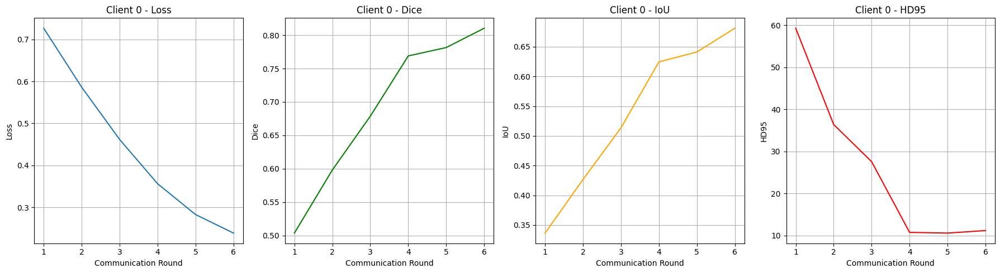

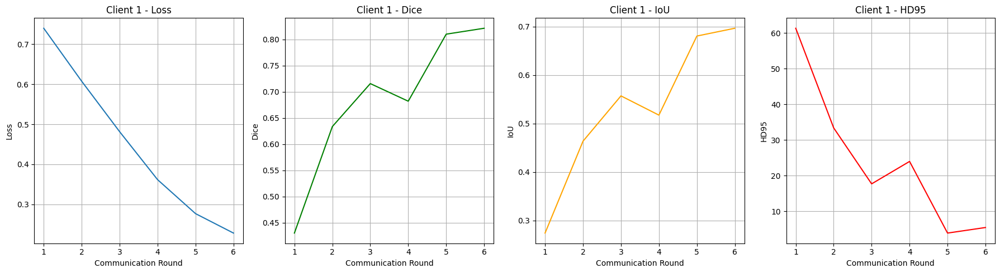

In [20]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

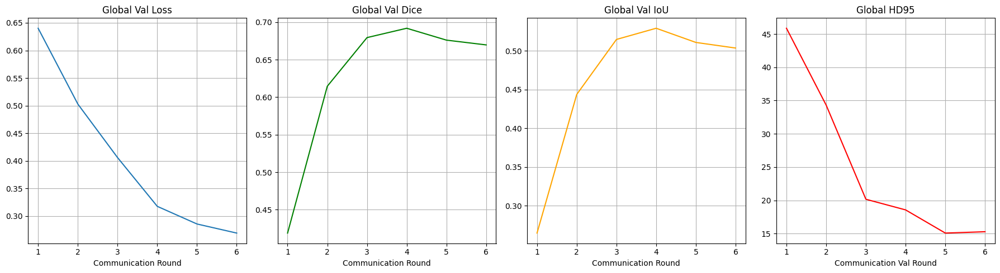

In [21]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [22]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test samples: 29
SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Li

Testing: 100%|██████████| 29/29 [00:12<00:00,  2.30it/s, Dice=0.6504, IoU=0.4819, HD95=29.6636]


Test Set Metrics:
Dice: 0.6504
IoU: 0.4819
HD95: 29.6636


**Visualize**

29


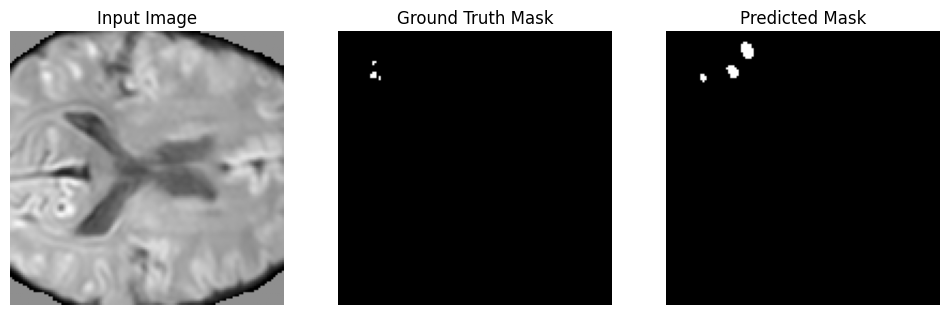

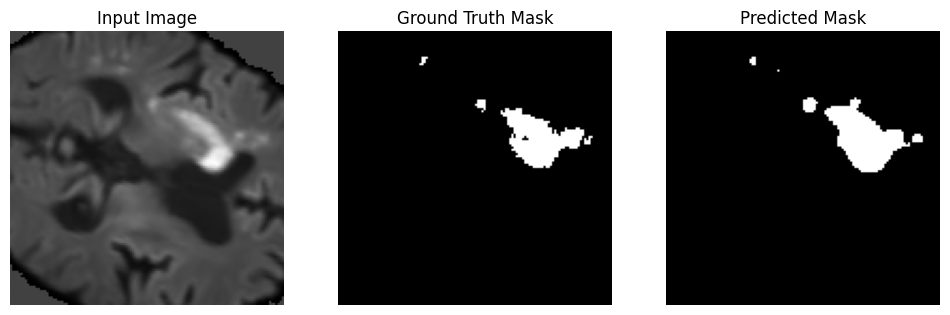

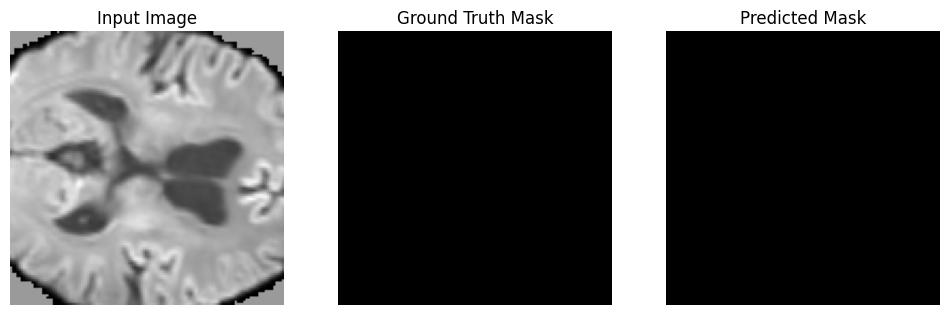

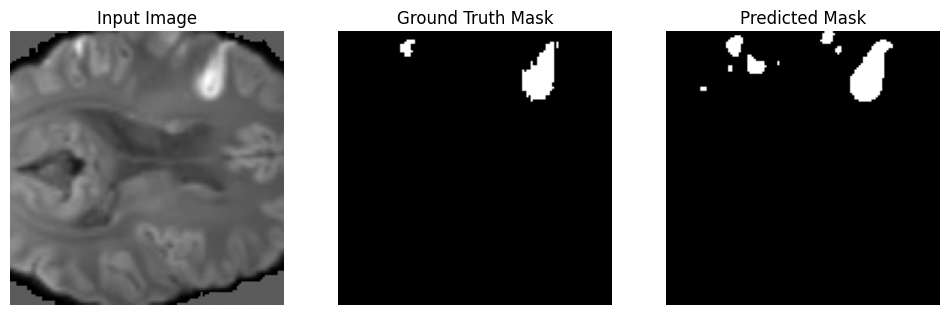

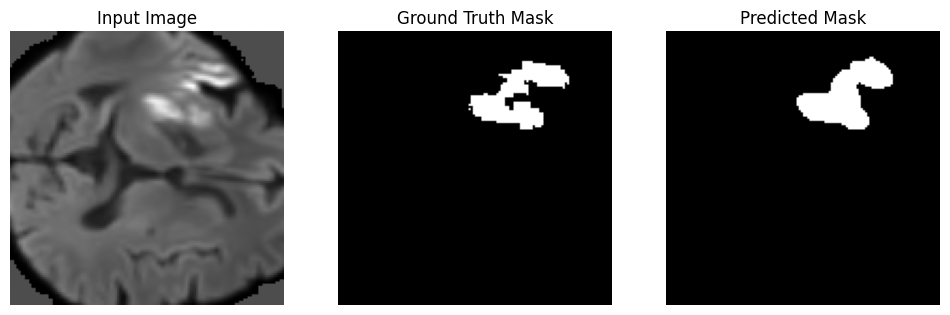

...

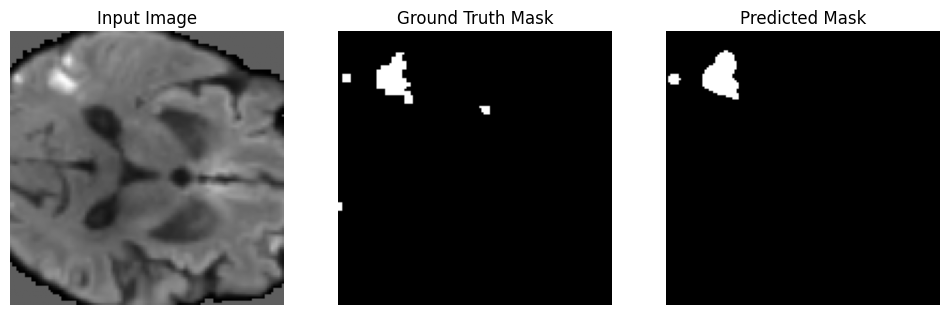

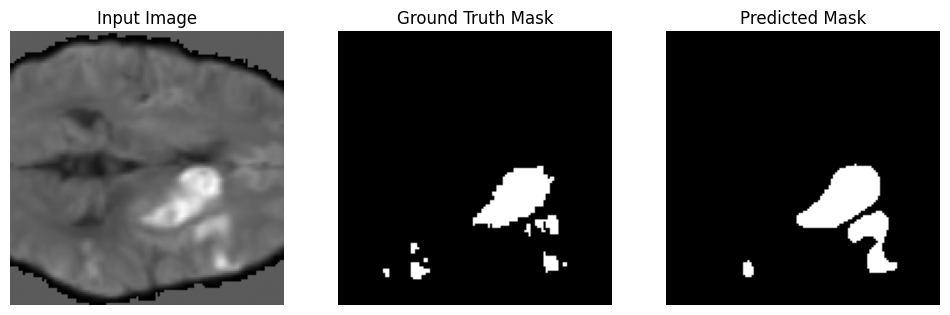

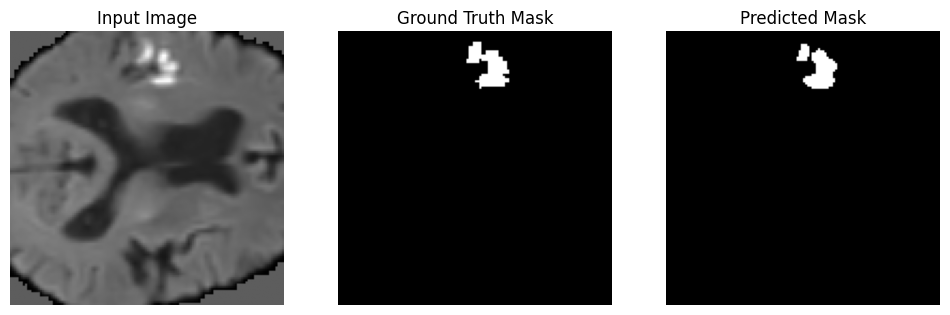

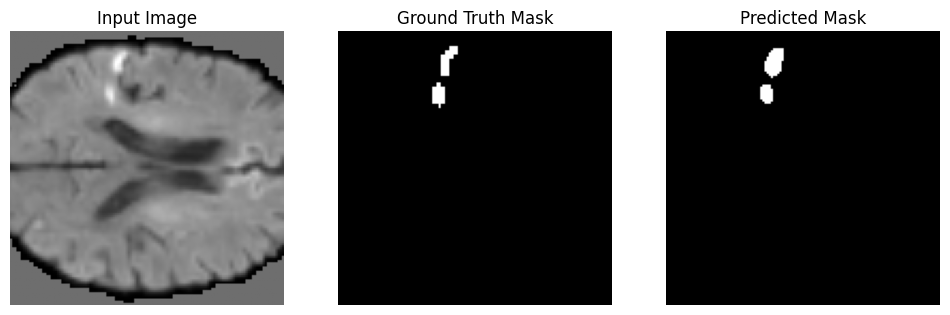

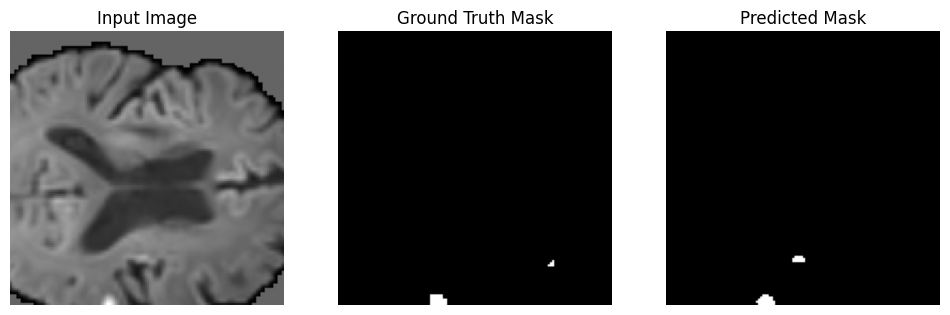

In [23]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()